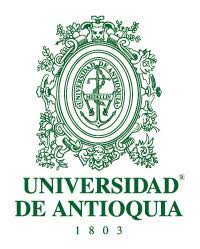

## **Miniproyecto 2 Modelos de Variable Latente para el Reconocimiento de Emociones**

Carolina Jiménez Restrepo

**Tratamiento de señales III**
**2023-2**

## Librerias

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()

from sklearn.decomposition import PCA
from sklearn.pipeline import make_pipeline
from sklearn.metrics import accuracy_score
from sklearn.naive_bayes import GaussianNB
from sklearn.decomposition import KernelPCA
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score



## Lectura del data frame

In [3]:
dataFrame = pd.read_pickle('/content/drive/MyDrive/TDS3/Actividades/Matriz.pkl')
dataFrame

,Promedio GSR,Proporción muestras negativas GSR,Potencia 1 GSR,Potencia 2 GSR,Potencia 3 GSR,Potencia 4 GSR,Potencia 5 GSR,Potencia 6 GSR,Potencia 7 GSR,Potencia 8 GSR,...,Pot Alpha T8,Pot Beta T8,Pote Gamma T8,Pot Alpha P3,Pot Beta P3,Pote Gamma P3,Pot Alpha P4,Pot Beta P4,Pote Gamma P4,Emociones
0,-18005.683435,0.175092,1.324827e+16,1.820018e+15,1.299195e+15,2.999675e+14,1.554577e+14,1.389752e+14,1.155849e+14,1.018787e+14,...,0.059805,209.081999,626.517834,0.060947,148.682156,280.555355,0.051872,177.814958,505.813631,2.0
1,-8794.650746,0.123315,3.182187e+15,9.641417e+14,4.038839e+14,8.747527e+13,4.359242e+13,3.706457e+13,2.282915e+13,1.011612e+13,...,0.050663,180.798331,169.559910,0.054627,118.042043,84.153282,0.109006,131.285066,136.897662,1.0
2,-1331.408630,0.127911,1.050701e+14,7.772538e+13,1.064465e+13,2.104828e+12,1.218868e+12,7.853350e+11,5.798011e+11,5.240840e+11,...,0.081392,209.187311,290.776411,0.058341,127.169850,147.253722,0.047109,130.703544,353.188633,2.0
3,3491.283824,0.104167,5.152051e+14,1.948242e+14,3.587921e+13,2.175470e+13,1.335715e+13,9.477871e+12,9.258891e+12,4.986428e+12,...,0.164800,267.148910,237.890043,0.102806,150.122394,99.089607,0.063703,141.406450,237.462649,2.0
4,-3736.386024,0.179228,5.783107e+14,1.654693e+14,2.956190e+13,2.066541e+13,1.884779e+13,1.669248e+13,1.244412e+13,8.400614e+12,...,0.162878,239.890903,159.612155,0.062664,161.770598,68.833606,0.104578,123.655222,125.324484,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
155,5204.994820,0.064951,1.128307e+15,3.685589e+13,1.851494e+13,1.013025e+13,8.734048e+12,2.438860e+12,2.281311e+12,1.578460e+12,...,0.066594,66.171837,18.752460,0.056133,129.382567,30.374613,0.062847,134.410959,38.643778,0.0
156,2975.633960,0.075061,3.614324e+14,1.821335e+14,1.203046e+13,1.175122e+13,1.062599e+13,4.786239e+12,3.244985e+12,2.732952e+12,...,0.041914,45.980171,16.711169,0.099239,122.245647,29.076624,0.539348,130.768058,34.661503,0.0
157,7866.527529,0.050092,2.563724e+15,3.271460e+14,5.379059e+13,2.057430e+13,1.451800e+13,1.088284e+13,7.551157e+12,4.318652e+12,...,0.011877,54.927643,19.400254,0.024097,143.610109,38.818626,0.140279,134.925432,46.144572,0.0
158,-2334.049943,0.172028,2.283602e+14,2.096848e+13,7.804638e+12,7.048904e+12,6.929199e+12,2.888520e+12,2.236628e+12,1.360761e+12,...,0.044652,50.644001,31.750751,0.084630,96.402846,33.583795,0.629482,134.945142,38.415527,2.0


### Extracción de datos

In [4]:
# A continuación se extraen las etiquetas de emociones y los valores de las características
y = dataFrame['Emociones']
x = dataFrame.drop(columns = ['Emociones']).values #Se elimina la columna de las emociones
N, D = x.shape #(160,93)

# Convertir la etiqueta en un array de enteros
scaler = StandardScaler()
scaler.fit(x)
X= scaler.transform(x)

# Imprimir el número de ejemplos y características
print('Número de datos:', N)
print('Número de características:', D)

Número de datos: 160
Número de características: 93


## Punto *1*


In [5]:
 #Al PCA se le entrega la matriz de covarianza

pca = PCA(n_components=D)
projectedZ = pca.fit_transform(X) # Entrenamos el modelo PCA (Calculamos los parámetros de proyección W, autovals, autovecs)

print(pca.components_.shape)
print(projectedZ.shape)

(93, 93)
(160, 93)


Input Space: (160, 93)
Latent Space: (160, 93)
[1.10360043e+01 1.04369205e+01 8.32868970e+00 6.37311915e+00
 5.06083325e+00 4.64994644e+00 4.00482906e+00 2.83552323e+00
 2.46966868e+00 2.32820216e+00 2.22921656e+00 2.05573088e+00
 1.92586308e+00 1.70886026e+00 1.68978299e+00 1.56053657e+00
 1.40996423e+00 1.33691181e+00 1.26687687e+00 1.18719807e+00
 1.10778488e+00 1.08861853e+00 1.03954533e+00 9.70472411e-01
 9.15672584e-01 8.54824206e-01 8.27764960e-01 7.58918306e-01
 7.39332889e-01 7.21299793e-01 6.84059544e-01 6.50914317e-01
 6.09261326e-01 5.95165660e-01 5.57292988e-01 5.03036790e-01
 4.87432515e-01 4.58053847e-01 4.44157802e-01 4.10684418e-01
 3.79495715e-01 3.74522851e-01 3.62133997e-01 3.48255745e-01
 3.45363791e-01 3.05975113e-01 2.79666474e-01 2.70937672e-01
 2.51911472e-01 2.41276824e-01 2.20811648e-01 1.92622665e-01
 1.80355996e-01 1.48140579e-01 1.40058486e-01 1.28079163e-01
 1.13641817e-01 1.05961807e-01 8.44744764e-02 7.90233192e-02
 6.67226081e-02 6.46883791e-02 6.40737

Text(0.5, 1.0, 'Var explained normalized')

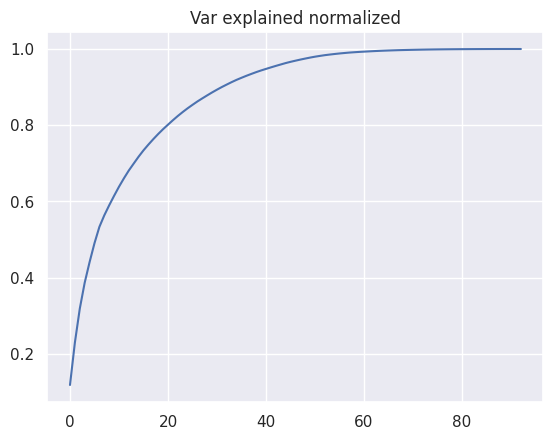

In [6]:
BasisW = pca.components_
print('Input Space:', X.shape)
print('Latent Space:',projectedZ.shape)
print(pca.explained_variance_)
print(BasisW.shape)
plt.plot(np.cumsum(pca.explained_variance_)/np.sum(pca.explained_variance_))
plt.title('Var explained normalized')
#plt.xlim(0,40)

Al graficar la varianza de los datos se observa que las 93 características no varían en gran medida entre sí, por tanto, para preservar el 90% de la varianza de los datos originales se deben de escoger aproximadamente 2 componentes.

Se realiza el análisis con valores de q = [2,4,8,12]



## PCA

###Para q = 2

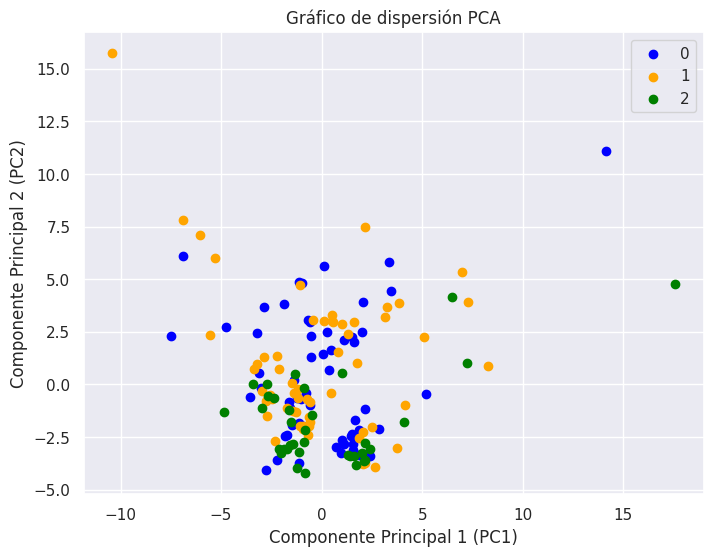

In [7]:
pca = PCA(n_components=2)
df_pca = pca.fit_transform(X)
BasisW = pca.components_

# Crear un DataFrame con los resultados de PCA y las etiquetas
df_resultado = pd.DataFrame(data=df_pca, columns=['PC1', 'PC2'])
df_resultado['Etiqueta'] = y

# Graficar el scatter plot
plt.figure(figsize=(8, 6))

# Colores para cada clase
colores = ['blue', 'orange', 'green']

for etiqueta, color in zip(range(len(colores)), colores):
    plt.scatter(
        df_resultado[df_resultado['Etiqueta'] == etiqueta]['PC1'],
        df_resultado[df_resultado['Etiqueta'] == etiqueta]['PC2'],
        color=color,
        label=etiqueta
              )

plt.title('Gráfico de dispersión PCA')
plt.xlabel('Componente Principal 1 (PC1)')
plt.ylabel('Componente Principal 2 (PC2)')
plt.legend()
plt.show()

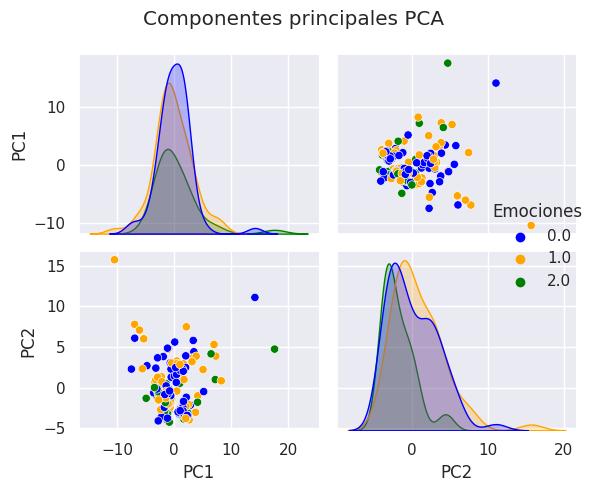

In [8]:
data = pd.DataFrame(data=df_pca, columns=["PC1", "PC2"])
data["Emociones"] = y  # Agregar las etiquetas de estados emocionales

# Utiliza pair plot para visualizar las relaciones entre las proyecciones en pares de componentes principales
sns.pairplot(data, hue="Emociones", palette=colores)
plt.suptitle('Componentes principales PCA')
plt.tight_layout()
plt.show()

### Para q = 4

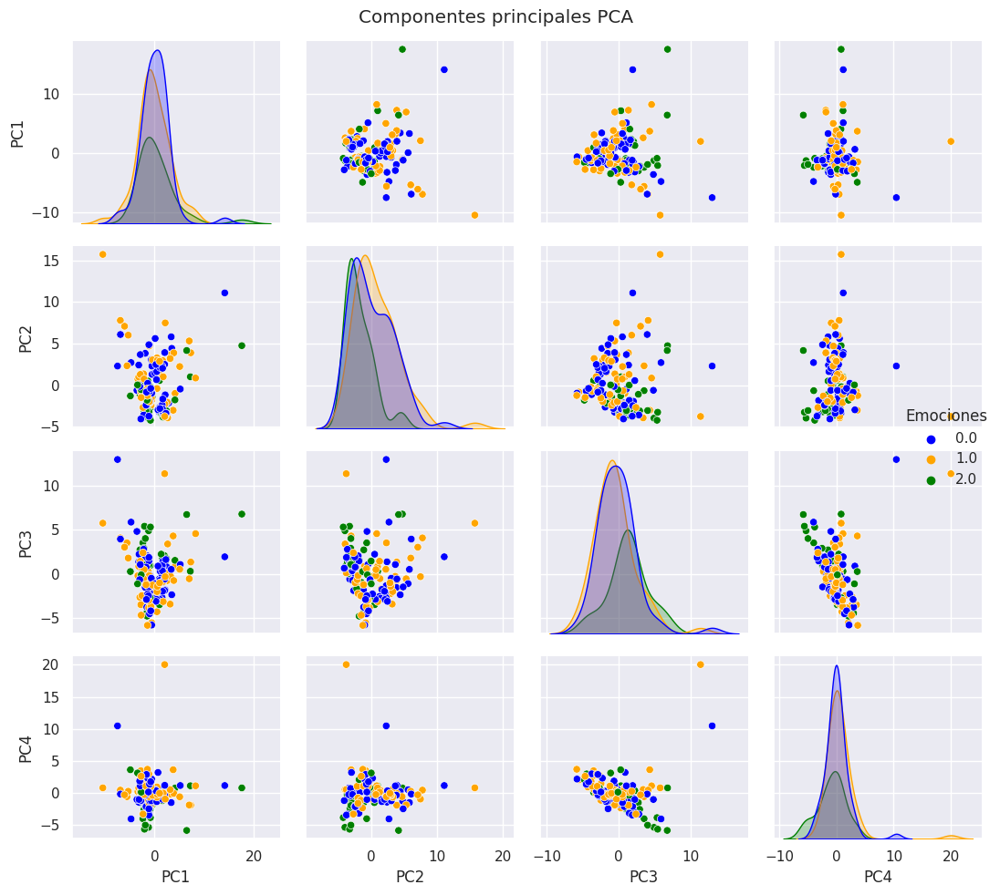

In [9]:
# Obtén las componentes principales proyectadas
pca = PCA(n_components=4)
X_pca = pca.fit_transform(X) #Se entrega un array con el ajuste y la transformación de los datos

# Crea un DataFrame para facilitar la visualización con seaborn
data = pd.DataFrame(data=X_pca, columns=["PC1", "PC2", "PC3", "PC4"])
data["Emociones"] = y  # Agregar las etiquetas de estados emocionales

# Utiliza pair plot para visualizar las relaciones entre las proyecciones en pares de componentes principales
sns.pairplot(data, hue="Emociones", palette=colores)
plt.suptitle('Componentes principales PCA')
plt.tight_layout()
plt.show()

###Para q = 8

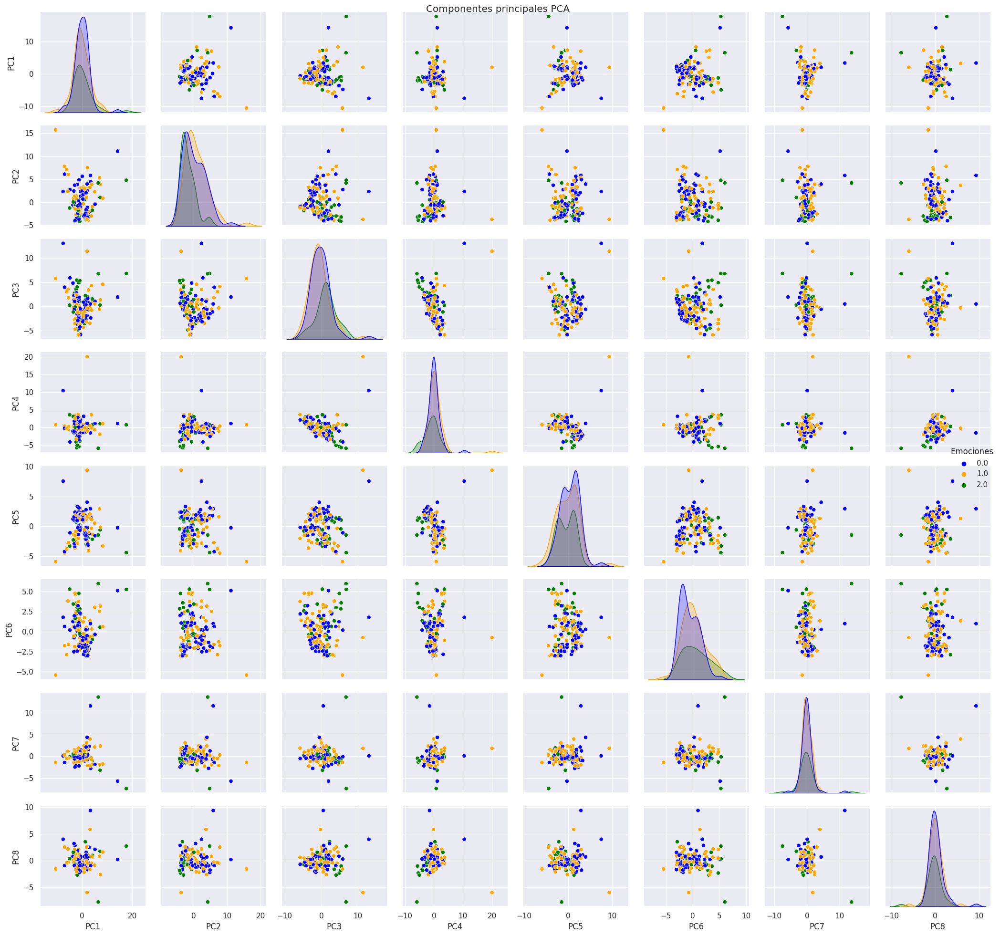

In [10]:
# Obtén las componentes principales proyectadas
pca = PCA(n_components=8)
X_pca = pca.fit_transform(X) #Se entrega un array con el ajuste y la transformación de los datos

# Crea un DataFrame para facilitar la visualización con seaborn
data = pd.DataFrame(data=X_pca, columns=["PC1", "PC2", "PC3", "PC4", "PC5", "PC6", "PC7", "PC8"])
data["Emociones"] = y  # Agregar las etiquetas de estados emocionales

# Utiliza pair plot para visualizar las relaciones entre las proyecciones en pares de componentes principales
sns.pairplot(data, hue="Emociones", palette=colores)
plt.suptitle('Componentes principales PCA')
plt.tight_layout()
plt.show()

### Para q = 12

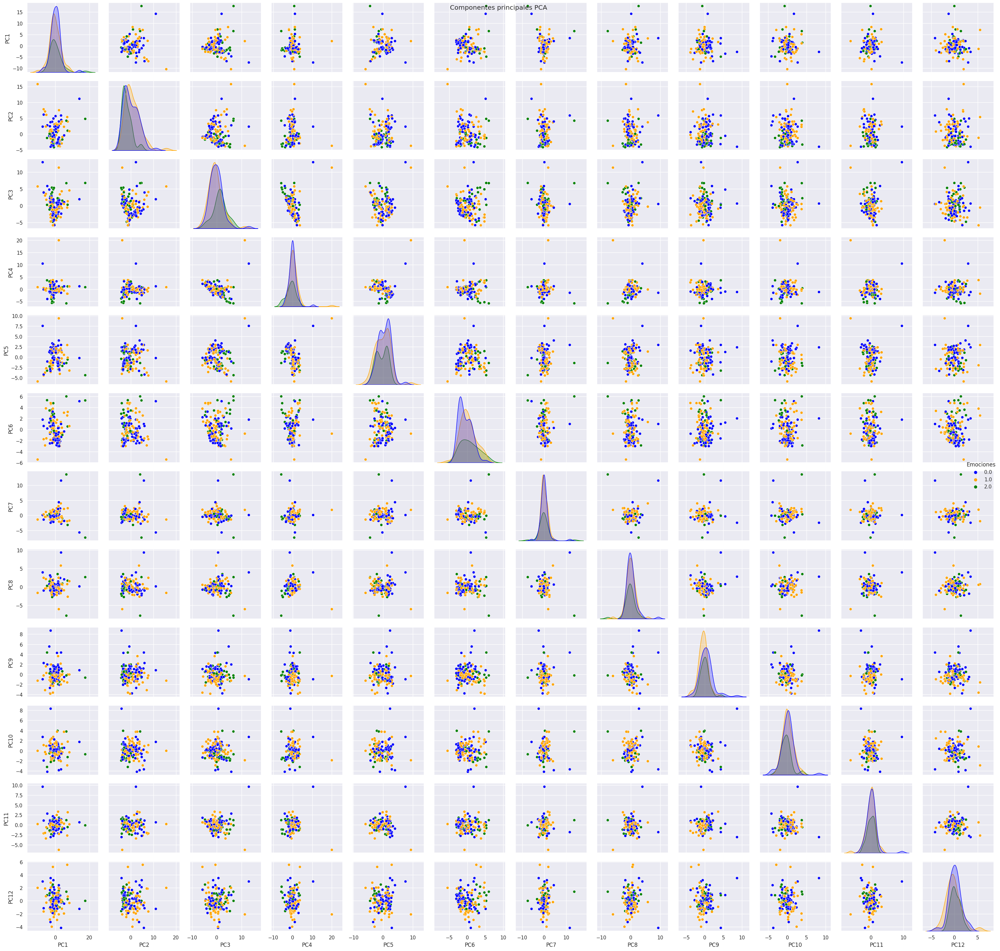

In [11]:
# Obtén las componentes principales proyectadas
pca = PCA(n_components=12)
X_pca = pca.fit_transform(X) #Se entrega un array con el ajuste y la transformación de los datos

# Crea un DataFrame para facilitar la visualización con seaborn
data = pd.DataFrame(data=X_pca, columns=["PC1", "PC2", "PC3", "PC4", "PC5", "PC6", "PC7", "PC8", "PC9", "PC10", "PC11", "PC12"])
data["Emociones"] = y  # Agregar las etiquetas de estados emocionales

# Utiliza pair plot para visualizar las relaciones entre las proyecciones en pares de componentes principales
sns.pairplot(data, hue="Emociones", palette=colores)
plt.suptitle('Componentes principales PCA')
plt.tight_layout()
plt.show()

### Qué puede observar al respecto?
Al visualizar el comportamiento en un espacio de menor dimensiones se encuentra que no se logra separar en grupos las 3 emociones presentes en los datos. Se observan varios datos atípicos, esto se puede dar porque PCA es muy sensible a este tipo de datos, sin embargo se logra ver que la emoción azul (triste) es la que más predomina.

### Mínimos Cuadrados, Bayesiano y Regresión Logística

### Mínimos cuadrados sin PCA

In [12]:
T1 = np.tile([1.,0.,0.],(62,1))
T2 = np.tile([0.,1.,0.],(62,1))
T3 = np.tile([0.,0.,1.],(36,1))
T = np.concatenate((T1,T2,T3),axis = 0)

In [13]:
perTest = 0.3 # porcentaje de datos para el TEST

X_train, X_test, T_train, T_test = train_test_split(X, T, test_size=perTest, random_state=0)
t_train = np.argmax(T_train,axis = 1)
t_test = np.argmax(T_test,axis = 1)

# Como el modelo compacto tiene Xtilde, debemos concatenar un vector 1s en la primer columna
Xtilde = np.concatenate((np.ones((112,93)),X_train),axis = 1)
XtildeT = Xtilde.T

# Ahora calculamos el modelo que tiene wk_tilde por cada columna relacionada una clase
Wtilde = np.linalg.inv(XtildeT@Xtilde+0.0000001*np.eye(186))@(XtildeT@T_train)

In [14]:
Y_est_train = Xtilde@Wtilde # predicciones de entrenamiento
Xtilde_test = np.concatenate((np.ones((48,93)),X_test),axis = 1)
Y_est_test = Xtilde_test@Wtilde # predicciones de entrenamiento

y_pred_train = np.argmax(Y_est_train,axis = 1)
y_pred_test = np.argmax(Y_est_test,axis = 1)

In [15]:
accTrain = accuracy_score(t_train,y_pred_train)
print('Acc Train: ',accTrain)
accTest = accuracy_score(t_test,y_pred_test)
print('Acc Test: ',accTest)

Acc Train:  1.0
Acc Test:  0.6458333333333334


### Mínimos cuadrados con PCA

###Para q =2

In [16]:
def min_cuadrado (X, T, perTest=0.3, n_components=2):
    # Reducción de dimensionalidad mediante PCA
    pca = PCA(n_components=n_components)
    df_pca = pca.fit_transform(X)

    # División de datos en conjuntos de entrenamiento y prueba
    X_train, X_test, T_train, T_test = train_test_split(df_pca, T, test_size=perTest, random_state=0)
    t_train = np.argmax(T_train, axis=1)
    t_test = np.argmax(T_test, axis=1)

    # Agregamos una columna de unos a X_train y X_test
    Xtilde_train = np.concatenate((np.ones((X_train.shape[0], 1)), X_train), axis=1)
    Xtilde_test = np.concatenate((np.ones((X_test.shape[0], 1)), X_test), axis=1)

    # Calculamos el modelo con Xtilde_train
    XtildeT_train = Xtilde_train.T
    a, b = XtildeT_train.shape
    Wtilde = np.linalg.inv(XtildeT_train @ Xtilde_train + 0.0000001 * np.eye(a)) @ (XtildeT_train @ T_train)

    # Predicciones de entrenamiento y prueba
    Y_est_train = Xtilde_train @ Wtilde
    Y_est_test = Xtilde_test @ Wtilde

    # Obtención de las clases predichas
    y_pred_train = np.argmax(Y_est_train, axis=1)
    y_pred_test = np.argmax(Y_est_test, axis=1)

    # Cálculo de la precisión
    accTrain = accuracy_score(t_train, y_pred_train)
    accTest = accuracy_score(t_test, y_pred_test)

    # Imprimir resultados
    print('Acc Train: ', accTrain)
    print('Acc Test: ', accTest)

# Llamada a la función con tus datos y número de componentes
min_cuadrado(X, T, perTest=0.3, n_components=2)


Acc Train:  0.6875
Acc Test:  0.6666666666666666


### Para q = 4

In [17]:
min_cuadrado(X, T, perTest=0.3, n_components=4)

Acc Train:  0.8303571428571429
Acc Test:  0.7083333333333334


### Para q = 8

In [18]:
min_cuadrado(X, T, perTest=0.3, n_components=8)

Acc Train:  0.8839285714285714
Acc Test:  0.8125


### Para q = 12

In [19]:
min_cuadrado(X, T, perTest=0.3, n_components=12)

Acc Train:  0.8928571428571429
Acc Test:  0.8333333333333334


### Para q = 32

In [20]:
min_cuadrado(X, T, perTest=0.3, n_components=32)

Acc Train:  0.9553571428571429
Acc Test:  0.9166666666666666


###Regresión Bayesiana sin PCA

In [21]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)
gnb = GaussianNB()
y_pred = gnb.fit(X_train, y_train).predict(X_test)
y_pred_train = gnb.fit(X_train, y_train).predict(X_train)
print("Number of mislabeled points out of a total ",X_test.shape[0]," points : ", (y_test != y_pred).sum())
accTrain = accuracy_score(y_train,y_pred_train)
print('Acc Train: ',accTrain)
accTest = accuracy_score(y_test,y_pred)
print('Acc Test: ',accTest)

Number of mislabeled points out of a total  48  points :  31
Acc Train:  0.6071428571428571
Acc Test:  0.3541666666666667


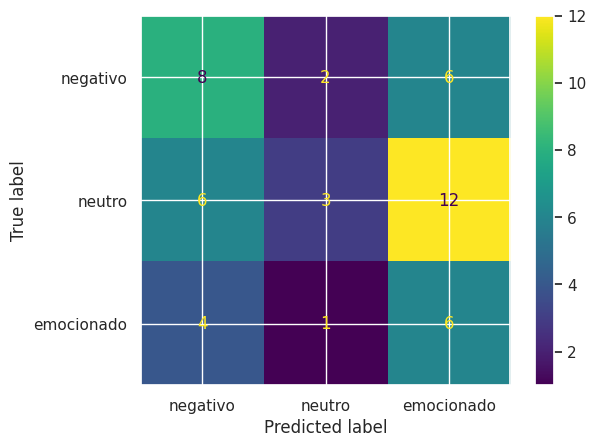

In [22]:
y_names =['negativo', 'neutro', 'emocionado']
cMat_test = confusion_matrix(y_test,y_pred)
ax = ConfusionMatrixDisplay(cMat_test,display_labels = y_names)
ax.plot()
plt.show()

### Regresión Bayesiana con PCA

### Para q = 2

In [23]:
pca = PCA(n_components=2)
df_pca = pca.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(df_pca, y, test_size=0.3, random_state=0)
gnb = GaussianNB()
y_pred = gnb.fit(X_train, y_train).predict(X_test)
y_pred_train = gnb.fit(X_train, y_train).predict(X_train)
print("Number of mislabeled points out of a total ",X_test.shape[0]," points : ", (y_test != y_pred).sum())
accTrain = accuracy_score(y_train,y_pred_train)
print('Acc Train: ',accTrain)
accTest = accuracy_score(y_test,y_pred)
print('Acc Test: ',accTest)

Number of mislabeled points out of a total  48  points :  33
Acc Train:  0.4375
Acc Test:  0.3125


### Para q = 4

In [24]:
pca = PCA(n_components=4)
df_pca = pca.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(df_pca, y, test_size=0.3, random_state=0)
gnb = GaussianNB()
y_pred = gnb.fit(X_train, y_train).predict(X_test)
y_pred_train = gnb.fit(X_train, y_train).predict(X_train)
print("Number of mislabeled points out of a total ",X_test.shape[0]," points : ", (y_test != y_pred).sum())
accTrain = accuracy_score(y_train,y_pred_train)
print('Acc Train: ',accTrain)
accTest = accuracy_score(y_test,y_pred)
print('Acc Test: ',accTest)

Number of mislabeled points out of a total  48  points :  27
Acc Train:  0.48214285714285715
Acc Test:  0.4375


### Para q = 8

In [25]:
pca = PCA(n_components=8)
df_pca = pca.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(df_pca, y, test_size=0.3, random_state=0)
gnb = GaussianNB()
y_pred = gnb.fit(X_train, y_train).predict(X_test)
y_pred_train = gnb.fit(X_train, y_train).predict(X_train)
print("Number of mislabeled points out of a total ",X_test.shape[0]," points : ", (y_test != y_pred).sum())
accTrain = accuracy_score(y_train,y_pred_train)
print('Acc Train: ',accTrain)
accTest = accuracy_score(y_test,y_pred)
print('Acc Test: ',accTest)

Number of mislabeled points out of a total  48  points :  30
Acc Train:  0.5
Acc Test:  0.375


### Para q = 12

In [26]:
pca = PCA(n_components=12)
df_pca = pca.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(df_pca, y, test_size=0.3, random_state=0)
gnb = GaussianNB()
y_pred = gnb.fit(X_train, y_train).predict(X_test)
y_pred_train = gnb.fit(X_train, y_train).predict(X_train)
print("Number of mislabeled points out of a total ",X_test.shape[0]," points : ", (y_test != y_pred).sum())
accTrain = accuracy_score(y_train,y_pred_train)
print('Acc Train: ',accTrain)
accTest = accuracy_score(y_test,y_pred)
print('Acc Test: ',accTest)

Number of mislabeled points out of a total  48  points :  28
Acc Train:  0.5446428571428571
Acc Test:  0.4166666666666667


### Para q = 32

In [27]:
pca = PCA(n_components=32)
df_pca = pca.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(df_pca, y, test_size=0.3, random_state=0)
gnb = GaussianNB()
y_pred = gnb.fit(X_train, y_train).predict(X_test)
y_pred_train = gnb.fit(X_train, y_train).predict(X_train)
print("Number of mislabeled points out of a total ",X_test.shape[0]," points : ", (y_test != y_pred).sum())
accTrain = accuracy_score(y_train,y_pred_train)
print('Acc Train: ',accTrain)
accTest = accuracy_score(y_test,y_pred)
print('Acc Test: ',accTest)

Number of mislabeled points out of a total  48  points :  26
Acc Train:  0.6964285714285714
Acc Test:  0.4583333333333333


### Regresión Logística sin PCA

[Logistic Regression] Number of mislabeled points out of a total  48  points :  26
Acc Train:  1.0
Acc Test:  0.4583333333333333


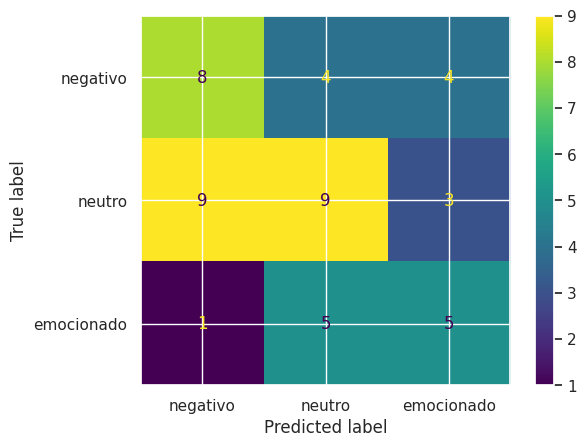

In [28]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)
clf = LogisticRegression(penalty ='l2',random_state=0, C = 1).fit(X_train, y_train)

y_pred_LR_train = clf.predict(X_train)
y_pred_LR_test = clf.predict(X_test)


print("[Logistic Regression] Number of mislabeled points out of a total ",X_test.shape[0]," points : ", (y_test != y_pred_LR_test).sum())
accTrain = accuracy_score(y_train,y_pred_LR_train)
print('Acc Train: ',accTrain)
accTest = accuracy_score(y_test,y_pred_LR_test)
print('Acc Test: ',accTest)
cMat_test = confusion_matrix(y_test,y_pred_LR_test)
ax = ConfusionMatrixDisplay(cMat_test,display_labels = y_names)
ax.plot()
plt.show()

### Regresión Logística con PCA

### Para q = 2

[Logistic Regression] Number of mislabeled points out of a total  48  points :  33
Acc Train:  0.45535714285714285
Acc Test:  0.3125


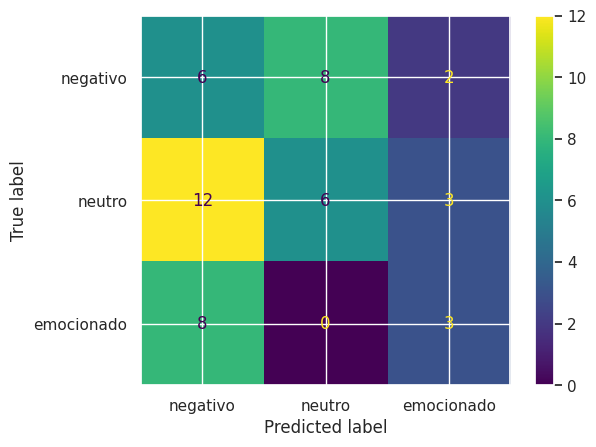

In [29]:
pca = PCA(n_components=2)
df_pca = pca.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(df_pca, y, test_size=0.3, random_state=0)
clf = LogisticRegression(penalty ='l2',random_state=0, C = 1).fit(X_train, y_train)

y_pred_LR_train = clf.predict(X_train)
y_pred_LR_test = clf.predict(X_test)


print("[Logistic Regression] Number of mislabeled points out of a total ",X_test.shape[0]," points : ", (y_test != y_pred_LR_test).sum())
accTrain = accuracy_score(y_train,y_pred_LR_train)
print('Acc Train: ',accTrain)
accTest = accuracy_score(y_test,y_pred_LR_test)
print('Acc Test: ',accTest)
cMat_test = confusion_matrix(y_test,y_pred_LR_test)
ax = ConfusionMatrixDisplay(cMat_test,display_labels = y_names)
ax.plot()
plt.show()


### Para q = 4

[Logistic Regression] Number of mislabeled points out of a total  48  points :  27
Acc Train:  0.5
Acc Test:  0.4375


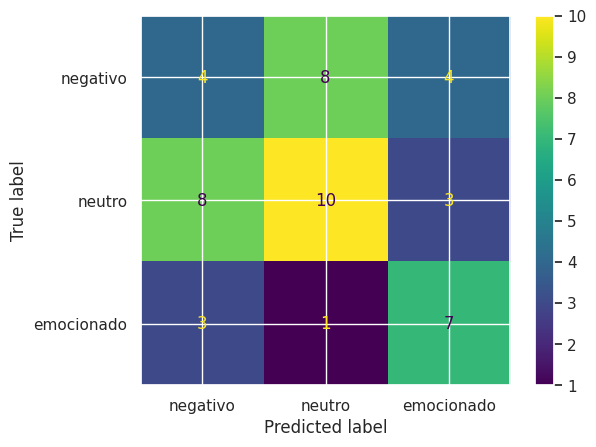

In [30]:
pca = PCA(n_components=4)
df_pca = pca.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(df_pca, y, test_size=0.3, random_state=0)
clf = LogisticRegression(penalty ='l2',random_state=0, C = 1).fit(X_train, y_train)

y_pred_LR_train = clf.predict(X_train)
y_pred_LR_test = clf.predict(X_test)


print("[Logistic Regression] Number of mislabeled points out of a total ",X_test.shape[0]," points : ", (y_test != y_pred_LR_test).sum())
accTrain = accuracy_score(y_train,y_pred_LR_train)
print('Acc Train: ',accTrain)
accTest = accuracy_score(y_test,y_pred_LR_test)
print('Acc Test: ',accTest)
cMat_test = confusion_matrix(y_test,y_pred_LR_test)
ax = ConfusionMatrixDisplay(cMat_test,display_labels = y_names)
ax.plot()
plt.show()

### Para q = 8

[Logistic Regression] Number of mislabeled points out of a total  48  points :  24
Acc Train:  0.625
Acc Test:  0.5


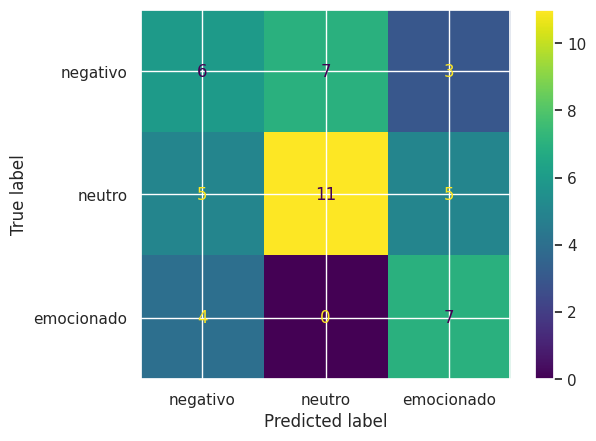

In [31]:
pca = PCA(n_components=8)
df_pca = pca.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(df_pca, y, test_size=0.3, random_state=0)
clf = LogisticRegression(penalty ='l2',random_state=0, C = 1).fit(X_train, y_train)

y_pred_LR_train = clf.predict(X_train)
y_pred_LR_test = clf.predict(X_test)


print("[Logistic Regression] Number of mislabeled points out of a total ",X_test.shape[0]," points : ", (y_test != y_pred_LR_test).sum())
accTrain = accuracy_score(y_train,y_pred_LR_train)
print('Acc Train: ',accTrain)
accTest = accuracy_score(y_test,y_pred_LR_test)
print('Acc Test: ',accTest)
cMat_test = confusion_matrix(y_test,y_pred_LR_test)
ax = ConfusionMatrixDisplay(cMat_test,display_labels = y_names)
ax.plot()
plt.show()

### Para q = 12

[Logistic Regression] Number of mislabeled points out of a total  48  points :  23
Acc Train:  0.6428571428571429
Acc Test:  0.5208333333333334


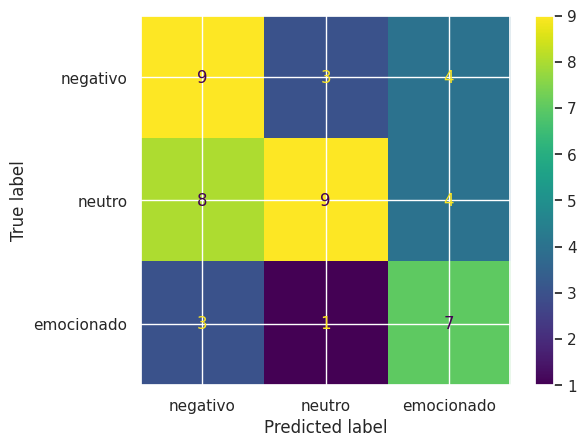

In [32]:
pca = PCA(n_components=12)
df_pca = pca.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(df_pca, y, test_size=0.3, random_state=0)
clf = LogisticRegression(penalty ='l2',random_state=0, C = 1).fit(X_train, y_train)

y_pred_LR_train = clf.predict(X_train)
y_pred_LR_test = clf.predict(X_test)


print("[Logistic Regression] Number of mislabeled points out of a total ",X_test.shape[0]," points : ", (y_test != y_pred_LR_test).sum())
accTrain = accuracy_score(y_train,y_pred_LR_train)
print('Acc Train: ',accTrain)
accTest = accuracy_score(y_test,y_pred_LR_test)
print('Acc Test: ',accTest)
cMat_test = confusion_matrix(y_test,y_pred_LR_test)
ax = ConfusionMatrixDisplay(cMat_test,display_labels = y_names)
ax.plot()
plt.show()

### Para q = 32

[Logistic Regression] Number of mislabeled points out of a total  48  points :  27
Acc Train:  0.8214285714285714
Acc Test:  0.4375


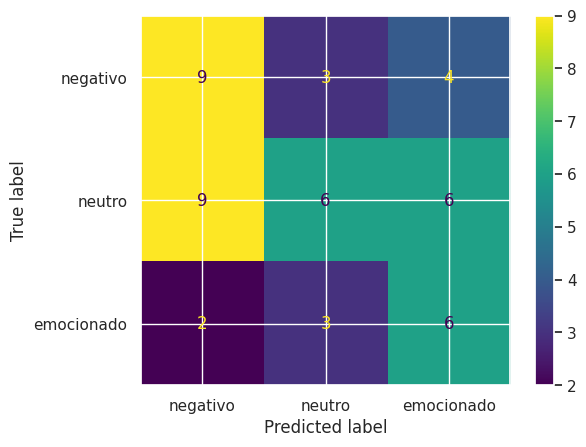

In [33]:
pca = PCA(n_components=32)
df_pca = pca.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(df_pca, y, test_size=0.3, random_state=0)
clf = LogisticRegression(penalty ='l2',random_state=0, C = 1).fit(X_train, y_train)

y_pred_LR_train = clf.predict(X_train)
y_pred_LR_test = clf.predict(X_test)


print("[Logistic Regression] Number of mislabeled points out of a total ",X_test.shape[0]," points : ", (y_test != y_pred_LR_test).sum())
accTrain = accuracy_score(y_train,y_pred_LR_train)
print('Acc Train: ',accTrain)
accTest = accuracy_score(y_test,y_pred_LR_test)
print('Acc Test: ',accTest)
cMat_test = confusion_matrix(y_test,y_pred_LR_test)
ax = ConfusionMatrixDisplay(cMat_test,display_labels = y_names)
ax.plot()
plt.show()

Se observa que tanto en la regresión bayesiana como en la logística el modelo esta sobreentrenado, ya que se ajusta muy bien a los datos de entrenamiento pero predice muy mal los del test, esto se puede confirmar en la matriz de confusión realizada.

También se observa que al aumentar los componentes va mejorando el train pero en un punto decae.

## Punto 2
PCA Y KPCA

q = 2

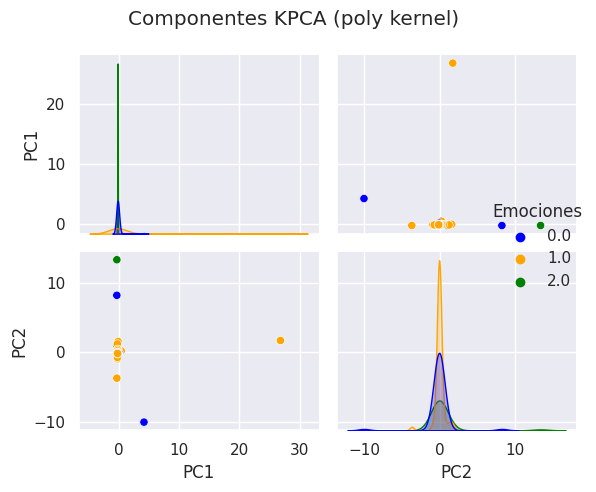

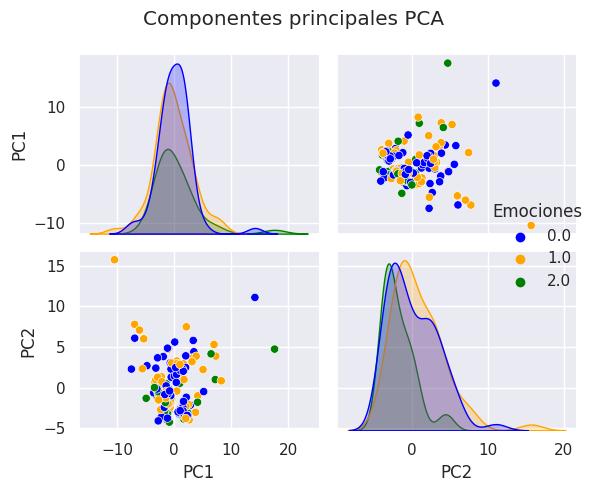

In [34]:
def visualize_kpca_pca (X, y, method='PCA', n_components=2, kernel='poly', palette=colores):
    if method == 'PCA':
        # Aplicar PCA para obtener las proyecciones
        pca = PCA(n_components=n_components)
        df_projection = pca.fit_transform(X)
        title = 'Componentes principales PCA'
    elif method == 'KPCA':
        # Aplicar KernelPCA para obtener las proyecciones
        kpca = KernelPCA(n_components=n_components, kernel=kernel)
        df_projection = kpca.fit_transform(X)
        title = f'Componentes KPCA ({kernel} kernel)'
    else:
        raise ValueError("Método no válido. Use 'PCA' o 'KPCA'.")

    # Crear un DataFrame para visualizar las proyecciones
    columns = [f"PC{i}" for i in range(1, n_components + 1)]
    data = pd.DataFrame(data=df_projection, columns=columns)
    data["Emociones"] = y  # Agregar las etiquetas de estados emocionales

    # Utilizar pair plot para visualizar las relaciones entre las proyecciones en pares de componentes principales
    sns.pairplot(data, hue="Emociones", palette=colores)
    plt.suptitle(title)
    plt.tight_layout()
    plt.show()



# llamada a la función para KPCA
visualize_kpca_pca(X, y, method='KPCA', n_components=2, kernel='poly', palette=colores)

#llamada a la función para PCA
visualize_kpca_pca(X, y, method='PCA', n_components=2, palette=colores)



q = 4

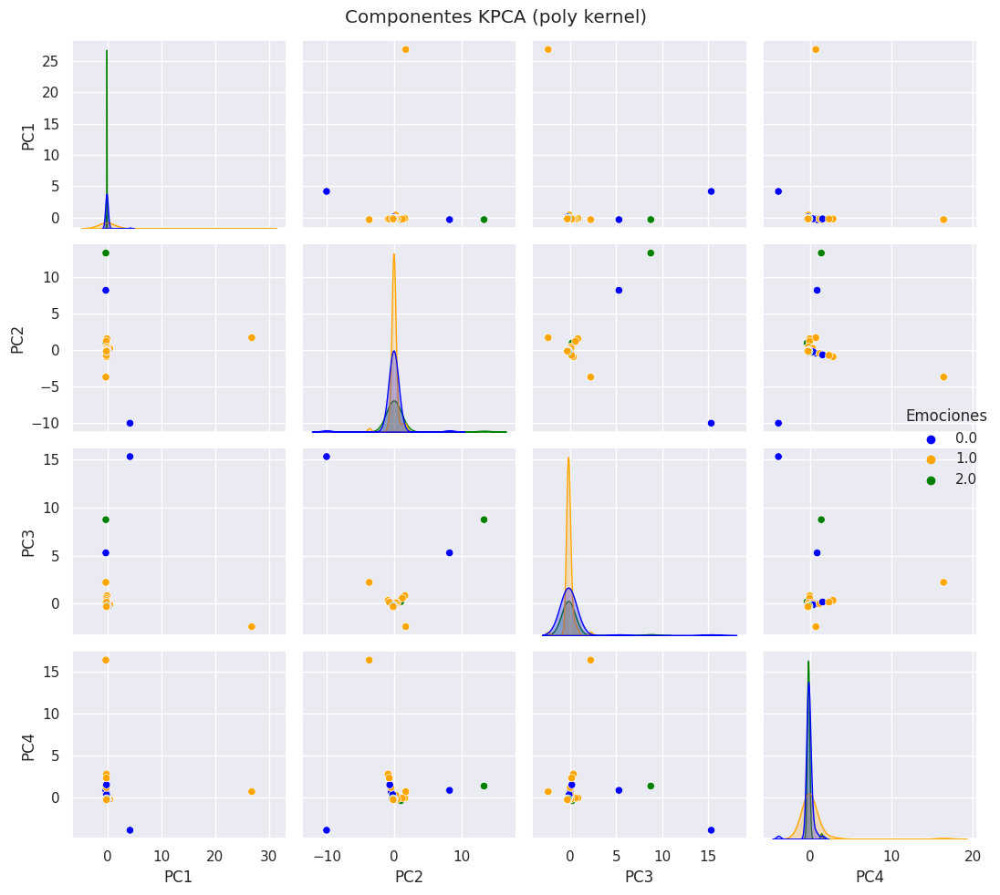

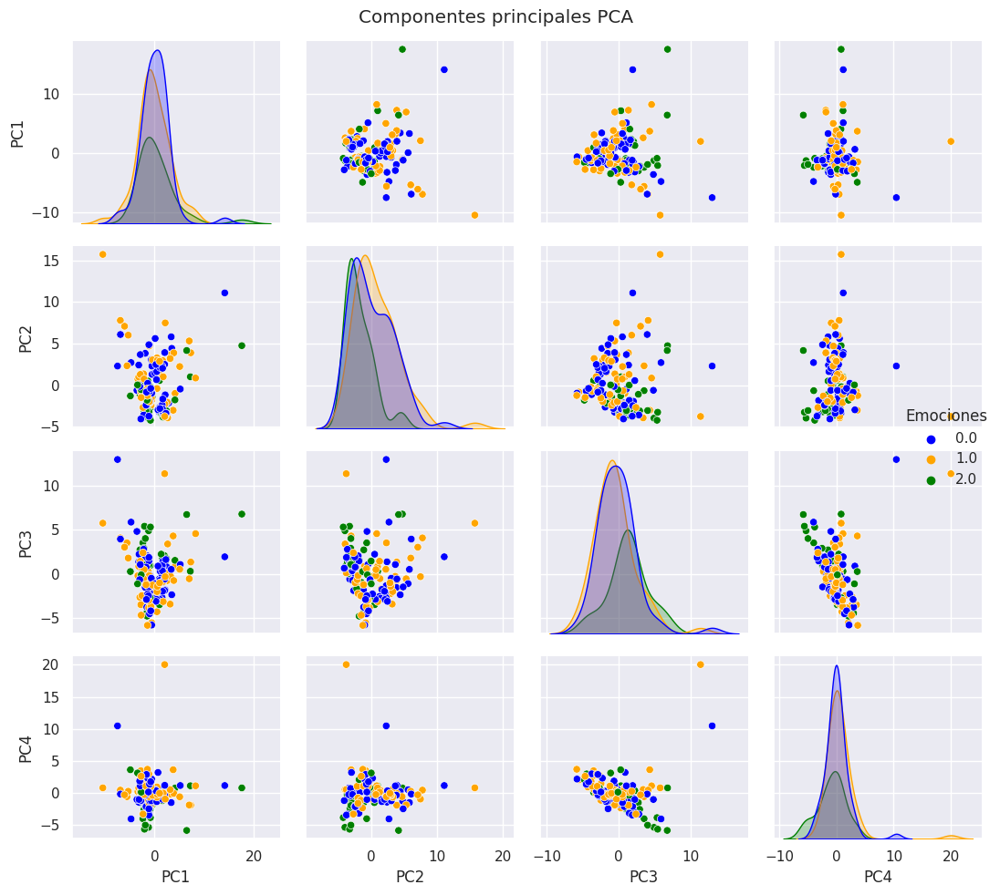

In [35]:
# llamada a la función para KPCA
visualize_kpca_pca(X, y, method='KPCA', n_components=4, kernel='poly', palette=colores)

# llamada a la función para PCA
visualize_kpca_pca(X, y, method='PCA', n_components=4, palette=colores)

q = 8

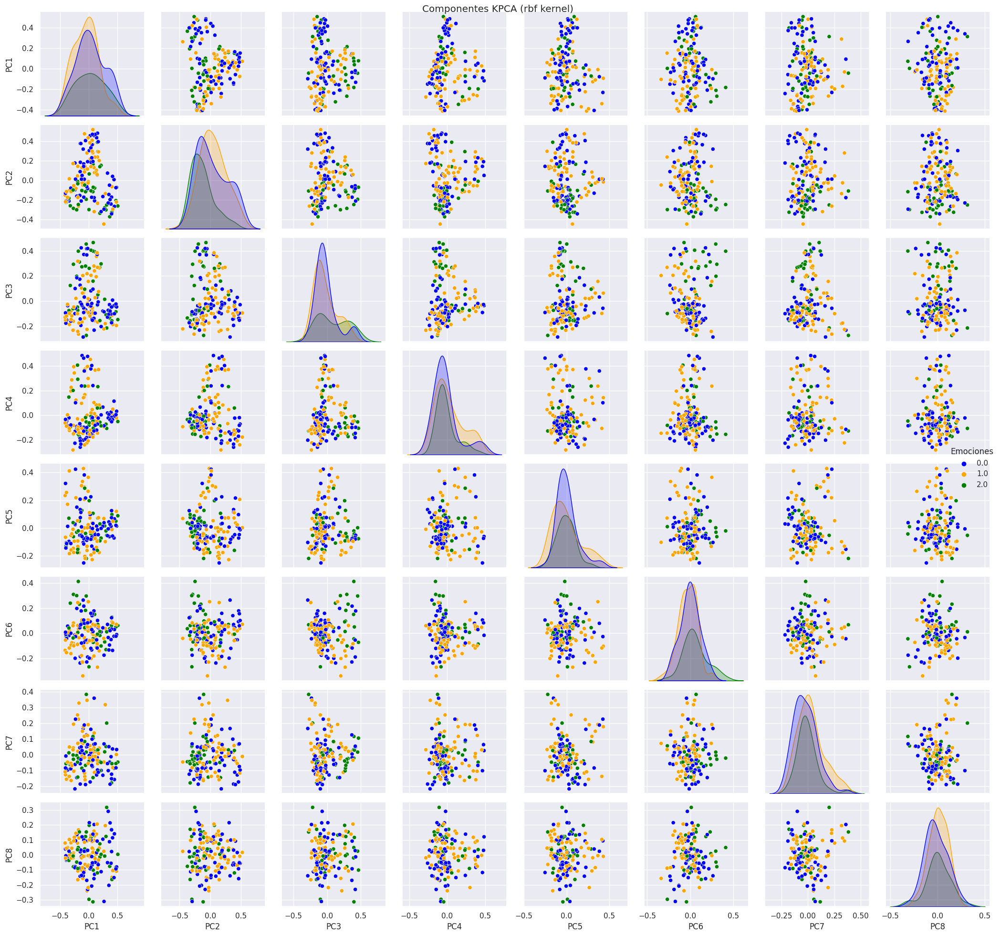

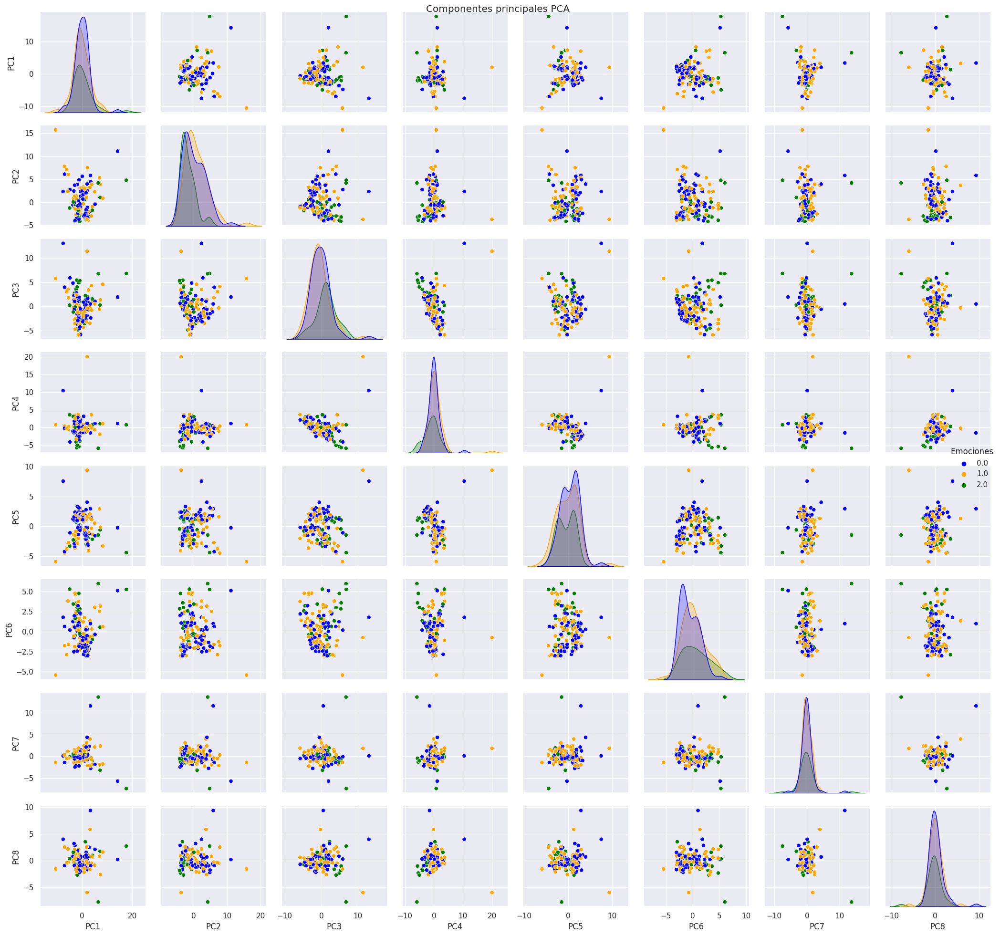

In [36]:
# llamada a la función para KPCA
visualize_kpca_pca(X, y, method='KPCA', n_components=8, kernel='rbf', palette=colores)

# llamada a la función para PCA
visualize_kpca_pca(X, y, method='PCA', n_components=8, palette=colores)

q = 12

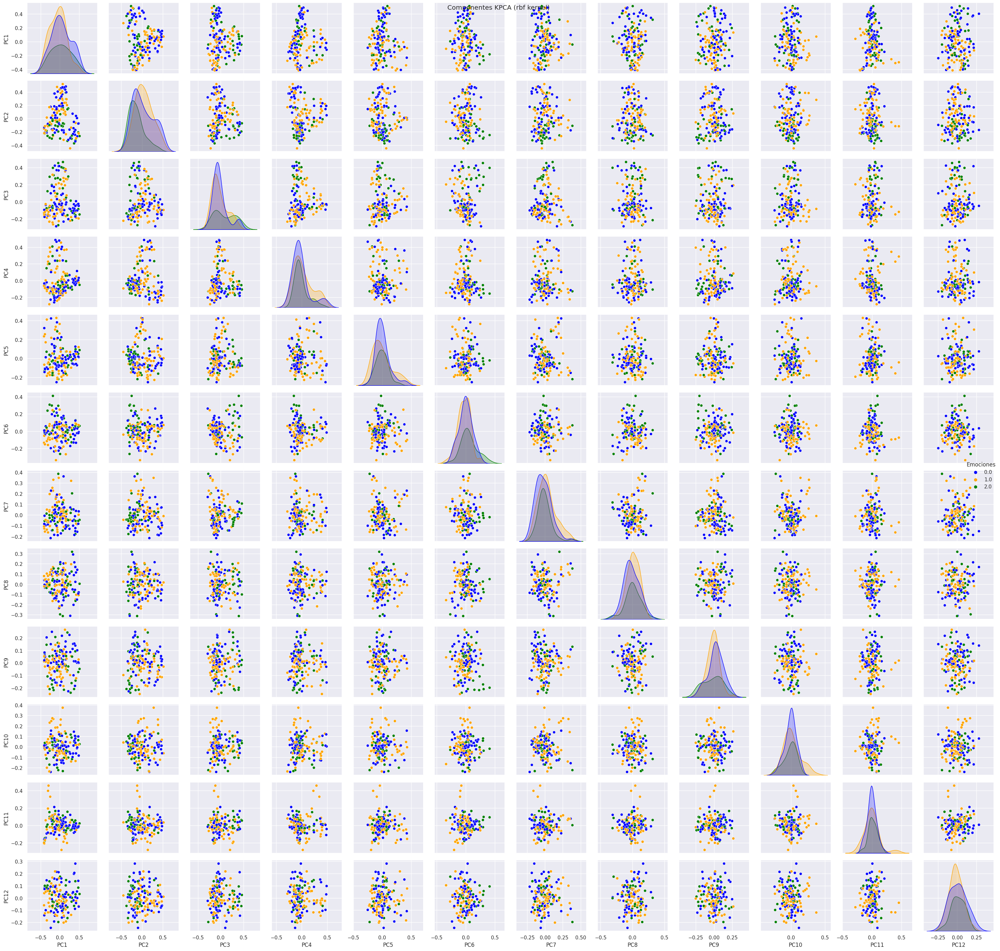

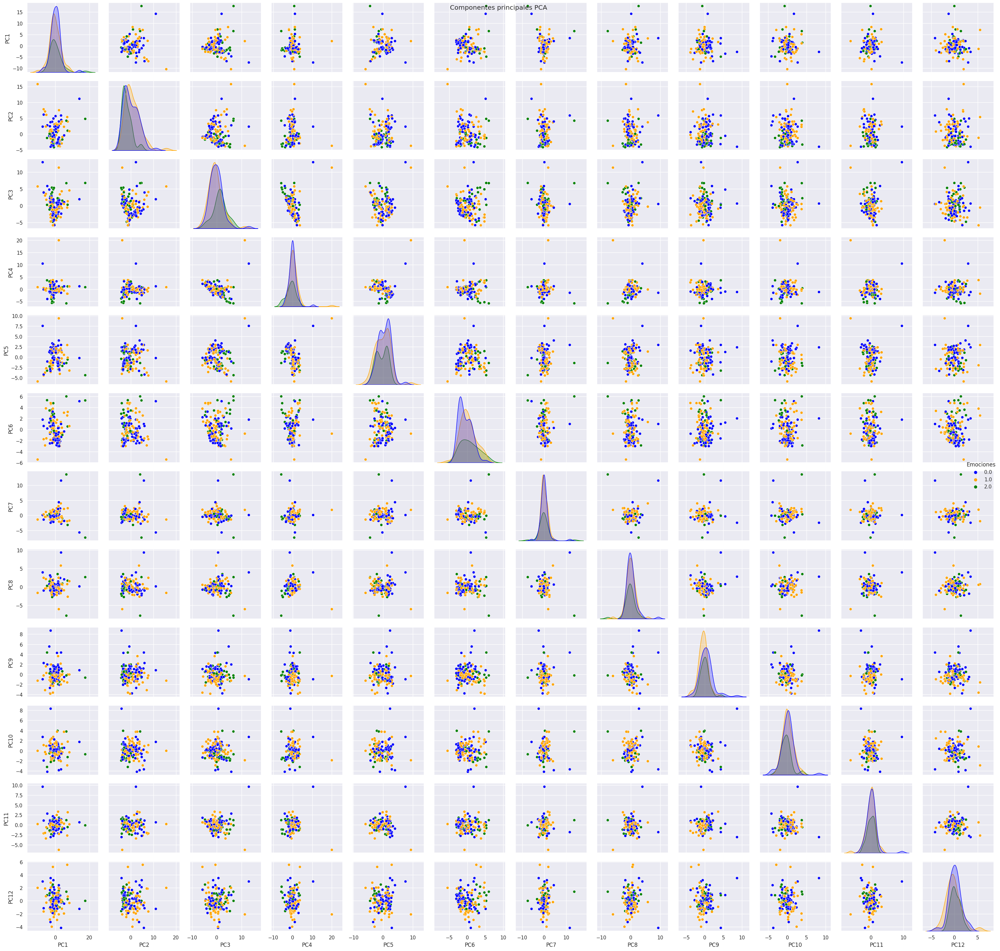

In [37]:
# llamada a la función para KPCA
visualize_kpca_pca(X, y, method='KPCA', n_components=12, kernel='rbf', palette=colores)

# llamada a la función para PCA
visualize_kpca_pca(X, y, method='PCA', n_components=12, palette=colores)

¿Cómo lucen las características proyectados en ambos espacios latentes PCA y KPCA?.
Dependiendo del kernel utilizado la dispersión de los datos se comportan de diferentes maneras para kpca y la emoción predominante cambia, también se observa que al aumentar el número de componentes hay un mayor número de características en KPCA comparado con las que se generan en PCA.

### Regresión logística KPCA

### Para q = 2

[Logistic Regression] Number of mislabeled points out of a total  48  points :  30
Acc Train:  0.49107142857142855
Acc Test:  0.375


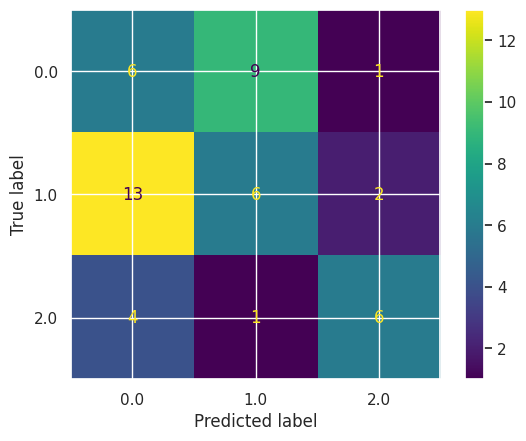

In [38]:
def kpca_logistica(X, y, n_components=2, kernel='cosine', test_size=0.3, random_state=0):
    # Aplicar KernelPCA para obtener las proyecciones
    kpca = KernelPCA(n_components=n_components, kernel=kernel)
    X_transformed = kpca.fit_transform(X)

    # Dividir los datos en conjuntos de entrenamiento y prueba
    X_train, X_test, y_train, y_test = train_test_split(X_transformed, y, test_size=test_size, random_state=random_state)

    # Entrenar el modelo de regresión logística
    clf = LogisticRegression(penalty='l2', random_state=random_state, C=1).fit(X_train, y_train)

    # Realizar predicciones en los conjuntos de entrenamiento y prueba
    y_pred_LR_train = clf.predict(X_train)
    y_pred_LR_test = clf.predict(X_test)

    # Imprimir el número de puntos mal etiquetados en el conjunto de prueba
    print("[Logistic Regression] Number of mislabeled points out of a total ", X_test.shape[0], " points : ", (y_test != y_pred_LR_test).sum())

    # Calcular la precisión en los conjuntos de entrenamiento y prueba
    accTrain = accuracy_score(y_train, y_pred_LR_train)
    print('Acc Train: ', accTrain)
    accTest = accuracy_score(y_test, y_pred_LR_test)
    print('Acc Test: ', accTest)

    # Mostrar la matriz de confusión para el conjunto de prueba
    cMat_test = confusion_matrix(y_test, y_pred_LR_test)
    ax = ConfusionMatrixDisplay(cMat_test, display_labels=list(set(y)))
    ax.plot()
    plt.show()

# llamada a la función
kpca_logistica(X, y, n_components=2, kernel='cosine', test_size=0.3, random_state=0)


### Para q = 4

[Logistic Regression] Number of mislabeled points out of a total  48  points :  31
Acc Train:  0.4642857142857143
Acc Test:  0.3541666666666667


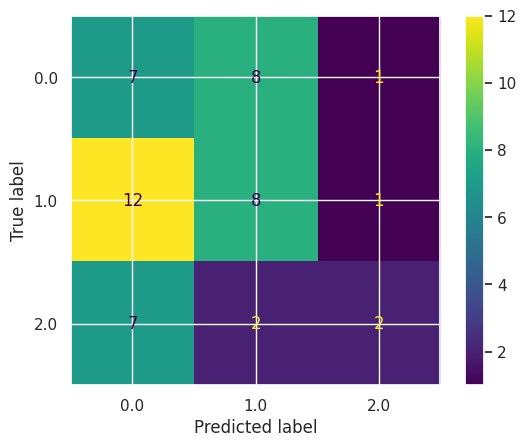

In [39]:
# llamada a la función
kpca_logistica(X, y, n_components=4, kernel='rbf', test_size=0.3, random_state=0)

### Para q = 8

[Logistic Regression] Number of mislabeled points out of a total  48  points :  25
Acc Train:  0.5803571428571429
Acc Test:  0.4791666666666667


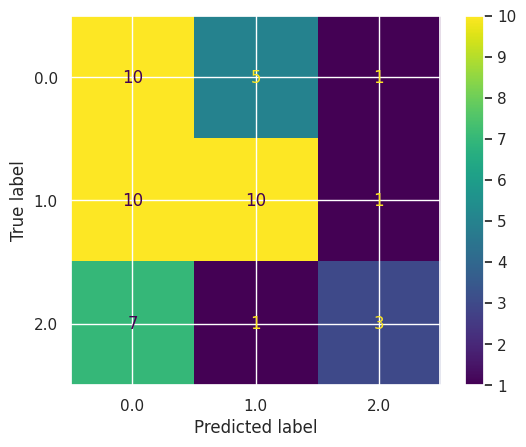

In [40]:
# llamada a la función
kpca_logistica(X, y, n_components=8, kernel='sigmoid', test_size=0.3, random_state=0)

### Para q = 12

[Logistic Regression] Number of mislabeled points out of a total  48  points :  28
Acc Train:  0.5625
Acc Test:  0.4166666666666667


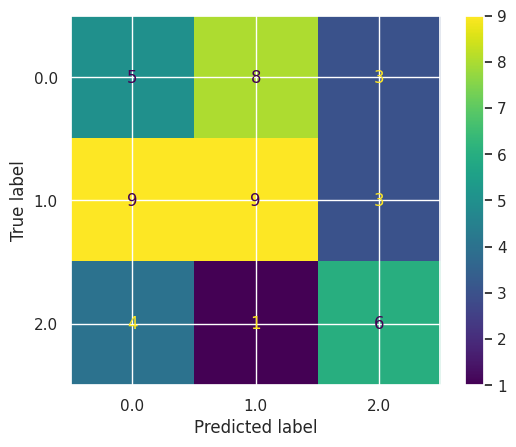

In [41]:
# llamada a la función
kpca_logistica(X, y, n_components=12, kernel='poly', test_size=0.3, random_state=0)

### Para q = 32

[Logistic Regression] Number of mislabeled points out of a total  48  points :  29
Acc Train:  0.6071428571428571
Acc Test:  0.3958333333333333


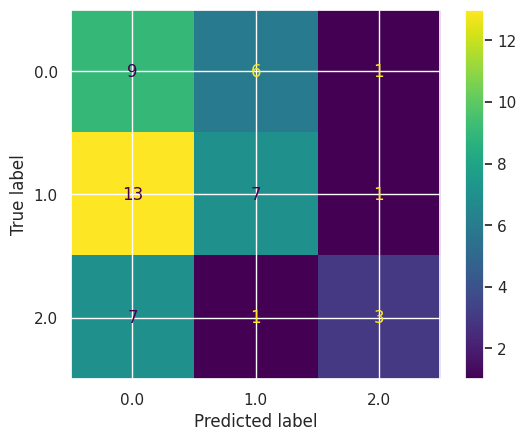

In [42]:
# llamada a la función
kpca_logistica(X, y, n_components=32, kernel='sigmoid', test_size=0.3, random_state=0)

### ¿Qué puede evidenciar en el desempeño del nuevo modelo de reconocimiento (con KPCA) para esta tarea?

Con el nuevo modelo, se evidencia que aún hay sobreentrenamiento, pero mejoran los resultados.

Al variar el kernel de polinimial a rbf se observa una mejora en el resultado de la presición de las predicciones.

Comparando el kernel rbf con sigmoid se observa que el número de errores aumenta.

Al comparar sigmoid con cosine se observa que el número de errores disminuye haciendo que la predicción mejore.

## Conclusiones
* Una ventaja de reducir la dimensión de las características es que se logra obtener información relevante, lo que no se puede obtener trabajando con todas las características ya que pueden estar muy correlacionadas entre sí y esto afecta al modelo.

* Se observan muchos datos atípicos en las gráficas. Esto se podría solucionar utilizando variantes de PCA, como KPCA, en el cual se observa que los datos no están tan dispersos y en varias características cambia la emoción predominante que se tenía en PCA. Esto también depende de los parámetros que se utilicen, como por ejemplo el kernel.

* Al comparar KPCA con PCA se observa que los datos no están tan dispersos y las gráficas de la diagonal se nota más angosta. Una de las razones para que esto pase es que PCA realiza una transformación lineal y asume relaciones lineales entre variables, en cambio, KPCA con kernel permite obtener relaciones no lineales aplicando un kernel.

* Al comparar los resultados obtenidos con los modelos de mínimos cuadrados, bayesiano y regresión logística, se observa lo siguiente:
Con mínimos cuadrados se obtiene una precisión entre 60 y 90, esta última alcanzada con 32 componentes.
Para el modelo bayesiano se tiene una precisión entre 30 y 45.
Y para la regresión logística se observa una precisión entre 30 y 50. Siendo así, el modelo de mínimos cuadrados el que muestra mejores resultados de precisión.

* Con la gráfica de varianza se puede tener una mayor seguridad sobre cuántos componentes principales mantener, ya que al reducir la dimensionalidad, hay una pérdida de información y la cantidad de información retenida depende de cuántos componentes principales se conserven.

* Para elegir cuántos componentes conservar, se debe tener un equilibrio entre mantener la información importante y reducir la dimensionalidad, ya que si se conservan demasiados componentes, aparece ruido en los datos, y conservar pocos nos da una pérdida significativa de información.

* La matriz de confusión nos proporciona una visión detallada del rendimiento del modelo en términos de predicciones correctas e incorrectas. Permite identificar los errores que comete el modelo, como falsos positivos, falsos negativos, verdaderos positivos y verdaderos negativos. También ayuda a identificar áreas específicas en las que el modelo puede necesitar ajustes o mejoras.

* Los bajos valores en la precisión pueden deberse a los datos utilizados, ya que si estos se encuentran muy correlacionados, se sobreajustan al modelo y no se obtiene un buen resultado. Una opción para mejorar el modelo sería aplicar regularización, ya que esta mejora la capacidad para generalizar a nuevos datos.